## Installing super gradients

In [ ]:
!pip install super-gradients

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.1/12.1 MB 33.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.2/139.2 kB 15.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 684.5/684.5 kB 23.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 59.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 77.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 408.6/408.6 kB 47.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 22.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.9/5.9 MB 92.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.7/15.7 MB 52.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 70.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup

In [ ]:
import os
import random
import torch
import requests
from PIL import Image

from super_gradients.training import Trainer, dataloaders, models
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050

from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train,
    coco_detection_yolo_format_val
)

from super_gradients.training.models.detection_models.pp_yolo_e import (
    PPYoloEPostPredictionCallback
)

[2024-07-09 10:09:20] INFO - crash_tips_setup.py - Crash tips is enabled. You can set your environment variable to CRASH_HANDLER=FALSE to disable it


The console stream is logged into /root/sg_logs/console.log


[2024-07-09 10:09:28] INFO - utils.py - NumExpr defaulting to 2 threads.


In [ ]:
class config:
    #trainer params
    CHECKPOINT_DIR = 'checkpoints' #specify the path you want to save checkpoints to
    EXPERIMENT_NAME = 'race_number' #specify the experiment name
    #dataset params

    DATA_DIR = '/content/datasets' #parent directory to where data lives
    TRAIN_IMAGES_DIR = 'train/images' #child dir of DATA_DIR where train images are
    TRAIN_LABELS_DIR = 'train/labels' #child dir of DATA_DIR where train labels are
    VAL_IMAGES_DIR = 'valid/images' #child dir of DATA_DIR where validation images are
    VAL_LABELS_DIR = 'valid/labels' #child dir of DATA_DIR where validation labels are
    # if you have a test set
    TEST_IMAGES_DIR = 'test/images' #child dir of DATA_DIR where test images are
    TEST_LABELS_DIR = 'test/labels' #child dir of DATA_DIR where test labels are

    CLASSES = ['free_parking_space','not_free_parking_space','partially_free_parking_space']
    NUM_CLASSES = len(CLASSES)

    #dataloader params - you can add whatever PyTorch dataloader params you have
    #could be different across train, val, and test
    DATALOADER_PARAMS={
    'batch_size': 4,
    'num_workers': 2
    }

    # model params
    MODEL_NAME = 'yolo_nas_l' # choose from yolo_nas_s, yolo_nas_m, yolo_nas_l
    PRETRAINED_WEIGHTS = 'coco' #only one option here: coco

In [ ]:
trainer = Trainer(experiment_name=config.EXPERIMENT_NAME,
                  ckpt_root_dir=config.CHECKPOINT_DIR)

In [ ]:
train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.TRAIN_IMAGES_DIR,
        'labels_dir': config.TRAIN_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.VAL_IMAGES_DIR,
        'labels_dir': config.VAL_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': config.DATA_DIR,
        'images_dir': config.TEST_IMAGES_DIR,
        'labels_dir': config.TEST_LABELS_DIR,
        'classes': config.CLASSES
    },
    dataloader_params=config.DATALOADER_PARAMS
)

[2024-07-09 10:21:52] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 16/16 [00:00<00:00, 3256.76it/s]
[2024-07-09 10:21:52] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 8/8 [00:00<00:00, 2740.03it/s]
[2024-07-09 10:21:52] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 6/6 [00:00<00:00, 1524.19it/s]


## see training data

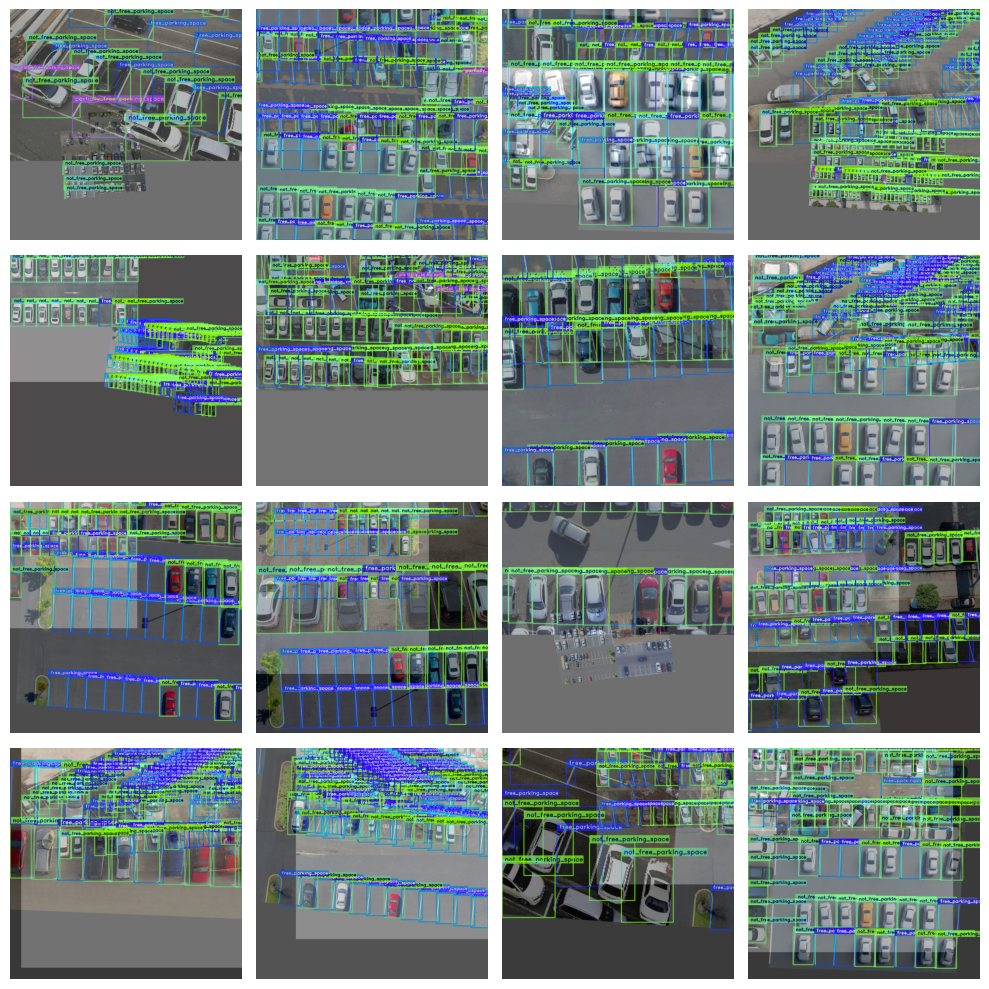

In [ ]:
train_data.dataset.plot()

## Initializing the model

In [ ]:
model = models.get(config.MODEL_NAME,
                   num_classes=config.NUM_CLASSES,
                   pretrained_weights=config.PRETRAINED_WEIGHTS
                   )

[2024-07-09 10:22:15] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-07-09 10:22:15] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
Downloading: "https://sghub.deci.ai/models/yolo_nas_l_coco.pth" to /root/.cache/torch/hub/checkpoints/yolo_nas_l_coco.pth
100%|██████████| 256M/256M [00:00<00:00, 287MB/s]
[2024-07-09 10:22:17] INFO - checkpoint

In [ ]:
train_params = {
    # ENABLING SILENT MODE
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "AdamW",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": 30,
    "mixed_precision": True, #mixed precision is not available for CPU
    "loss": PPYoloELoss(
        use_static_assigner=False,
        # NOTE: num_classes needs to be defined here
        num_classes=config.NUM_CLASSES,
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            # NOTE: num_classes needs to be defined here
            num_cls=config.NUM_CLASSES,
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

## train the model

In [ ]:
trainer.train(model=model,
              training_params=train_params,
              train_loader=train_data,
              valid_loader=val_data)

[2024-07-09 10:22:36] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240709_102236_971361`
[2024-07-09 10:22:36] INFO - sg_trainer.py - Checkpoints directory: checkpoints/race_number/RUN_20240709_102236_971361
[2024-07-09 10:22:37] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
/usr/local/lib/python3.10/dist-packages/super_gradients/common/registry/registry.py:72: DeprecationWarning: Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
  warnings.warn(f"Object name `{name}` is now deprecated. Please replace it with `{deprecated_names[name]}`.", DeprecationWarning)
/usr/local/lib/python3.10/dist-packages/super_gradients/training/utils/optimizer_utils.py:108: DeprecationWarning: initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr valu

The console stream is now moved to checkpoints/race_number/RUN_20240709_102236_971361/console_Jul09_10_22_36.txt


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
[2024-07-09 10:22:39] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            16         (len(train_set))
    - Batch size per GPU:           4          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             4          (num_gpus * batch_size)
    - Effective Batch size:         4          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         4          (len(train_loader))
    - Gradient updates per epoch:   4          (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_L  (66.91M parameters, 66.91M optimized)
    - L

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.1798
│   ├── Ppyoloeloss/loss_iou = 0.8157
│   ├── Ppyoloeloss/loss_dfl = 0.8157
│   └── Ppyoloeloss/loss = 3.8113
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.1375
    ├── Ppyoloeloss/loss_iou = 0.8853
    ├── Ppyoloeloss/loss_dfl = 0.8429
    ├── Ppyoloeloss/loss = 3.8657
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0008
    ├── F1@0.50 = 0.0
    └── Best_score_threshold = 0.0



Validating epoch 1: 100%|██████████| 2/2 [00:00<00:00,  2.44it/s]
[2024-07-09 10:23:11] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:23:11] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.21712259948253632


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 2.2098
│   │   ├── Epoch N-1      = 2.1798 (↗ 0.0299)
│   │   └── Best until now = 2.1798 (↗ 0.0299)
│   ├── Ppyoloeloss/loss_iou = 0.7268
│   │   ├── Epoch N-1      = 0.8157 (↘ -0.089)
│   │   └── Best until now = 0.8157 (↘ -0.089)
│   ├── Ppyoloeloss/loss_dfl = 0.6703
│   │   ├── Epoch N-1      = 0.8157 (↘ -0.1454)
│   │   └── Best until now = 0.8157 (↘ -0.1454)
│   └── Ppyoloeloss/loss = 3.6068
│       ├── Epoch N-1      = 3.8113 (↘ -0.2044)
│       └── Best until now = 3.8113 (↘ -0.2044)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.1167
    │   ├── Epoch N-1      = 2.1375 (↘ -0.0208)
    │   └── Best until now = 2.1375 (↘ -0.0208)
    ├── Ppyoloeloss/loss_iou = 0.5504
    │   ├── Epoch N-1      = 0.8853 (↘ -0.3349)
    │   └── Best until now = 0.8853 (↘ -0.3349)
    ├── Ppyoloeloss/loss_dfl = 0.6169
    │   ├── Epoch N-1      = 0.8429 (↘ -0.226)
    │   └── Best until now = 0.8429 (↘ -0.226)
    ├── Ppyoloeloss/loss = 3

Validating epoch 2: 100%|██████████| 2/2 [00:00<00:00,  2.47it/s]
[2024-07-09 10:23:26] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:23:26] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.27032339572906494


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.6858
│   │   ├── Epoch N-1      = 2.2098 (↘ -0.524)
│   │   └── Best until now = 2.1798 (↘ -0.494)
│   ├── Ppyoloeloss/loss_iou = 0.5795
│   │   ├── Epoch N-1      = 0.7268 (↘ -0.1473)
│   │   └── Best until now = 0.7268 (↘ -0.1473)
│   ├── Ppyoloeloss/loss_dfl = 0.5725
│   │   ├── Epoch N-1      = 0.6703 (↘ -0.0977)
│   │   └── Best until now = 0.6703 (↘ -0.0977)
│   └── Ppyoloeloss/loss = 2.8378
│       ├── Epoch N-1      = 3.6068 (↘ -0.7691)
│       └── Best until now = 3.6068 (↘ -0.7691)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4462
    │   ├── Epoch N-1      = 2.1167 (↘ -0.6705)
    │   └── Best until now = 2.1167 (↘ -0.6705)
    ├── Ppyoloeloss/loss_iou = 0.5299
    │   ├── Epoch N-1      = 0.5504 (↘ -0.0205)
    │   └── Best until now = 0.5504 (↘ -0.0205)
    ├── Ppyoloeloss/loss_dfl = 0.587
    │   ├── Epoch N-1      = 0.6169 (↘ -0.0299)
    │   └── Best until now = 0.6169 (↘ -0.0299)
    ├── Ppyoloeloss/loss 

Validating epoch 3: 100%|██████████| 2/2 [00:00<00:00,  2.53it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.1325
│   │   ├── Epoch N-1      = 1.6858 (↘ -0.5533)
│   │   └── Best until now = 1.6858 (↘ -0.5533)
│   ├── Ppyoloeloss/loss_iou = 0.5724
│   │   ├── Epoch N-1      = 0.5795 (↘ -0.0071)
│   │   └── Best until now = 0.5795 (↘ -0.0071)
│   ├── Ppyoloeloss/loss_dfl = 0.5503
│   │   ├── Epoch N-1      = 0.5725 (↘ -0.0222)
│   │   └── Best until now = 0.5725 (↘ -0.0222)
│   └── Ppyoloeloss/loss = 2.2552
│       ├── Epoch N-1      = 2.8378 (↘ -0.5826)
│       └── Best until now = 2.8378 (↘ -0.5826)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.4417
    │   ├── Epoch N-1      = 1.4462 (↗ 0.9955)
    │   └── Best until now = 1.4462 (↗ 0.9955)
    ├── Ppyoloeloss/loss_iou = 1.2274
    │   ├── Epoch N-1      = 0.5299 (↗ 0.6975)
    │   └── Best until now = 0.5299 (↗ 0.6975)
    ├── Ppyoloeloss/loss_dfl = 1.4203
    │   ├── Epoch N-1      = 0.587  (↗ 0.8333)
    │   └── Best until now = 0.587  (↗ 0.8333)
    ├── Ppyoloeloss/loss = 5

Validating epoch 4: 100%|██████████| 2/2 [00:00<00:00,  2.59it/s]


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.0054
│   │   ├── Epoch N-1      = 1.1325 (↘ -0.1271)
│   │   └── Best until now = 1.1325 (↘ -0.1271)
│   ├── Ppyoloeloss/loss_iou = 0.6027
│   │   ├── Epoch N-1      = 0.5724 (↗ 0.0303)
│   │   └── Best until now = 0.5724 (↗ 0.0303)
│   ├── Ppyoloeloss/loss_dfl = 0.5953
│   │   ├── Epoch N-1      = 0.5503 (↗ 0.045)
│   │   └── Best until now = 0.5503 (↗ 0.045)
│   └── Ppyoloeloss/loss = 2.2034
│       ├── Epoch N-1      = 2.2552 (↘ -0.0518)
│       └── Best until now = 2.2552 (↘ -0.0518)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.6318
    │   ├── Epoch N-1      = 2.4417 (↗ 0.19)
    │   └── Best until now = 1.4462 (↗ 1.1855)
    ├── Ppyoloeloss/loss_iou = 1.9397
    │   ├── Epoch N-1      = 1.2274 (↗ 0.7123)
    │   └── Best until now = 0.5299 (↗ 1.4098)
    ├── Ppyoloeloss/loss_dfl = 2.8649
    │   ├── Epoch N-1      = 1.4203 (↗ 1.4446)
    │   └── Best until now = 0.587  (↗ 2.2779)
    ├── Ppyoloeloss/loss = 7.4364
  

Validating epoch 5: 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9567
│   │   ├── Epoch N-1      = 1.0054 (↘ -0.0487)
│   │   └── Best until now = 1.0054 (↘ -0.0487)
│   ├── Ppyoloeloss/loss_iou = 0.5594
│   │   ├── Epoch N-1      = 0.6027 (↘ -0.0433)
│   │   └── Best until now = 0.5724 (↘ -0.013)
│   ├── Ppyoloeloss/loss_dfl = 0.6106
│   │   ├── Epoch N-1      = 0.5953 (↗ 0.0153)
│   │   └── Best until now = 0.5503 (↗ 0.0603)
│   └── Ppyoloeloss/loss = 2.1267
│       ├── Epoch N-1      = 2.2034 (↘ -0.0767)
│       └── Best until now = 2.2034 (↘ -0.0767)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.2451
    │   ├── Epoch N-1      = 2.6318 (↘ -2.3867)
    │   └── Best until now = 1.4462 (↘ -1.2011)
    ├── Ppyoloeloss/loss_iou = 0.0
    │   ├── Epoch N-1      = 1.9397 (↘ -1.9397)
    │   └── Best until now = 0.5299 (↘ -0.5299)
    ├── Ppyoloeloss/loss_dfl = 0.0
    │   ├── Epoch N-1      = 2.8649 (↘ -2.8649)
    │   └── Best until now = 0.587  (↘ -0.587)
    ├── Ppyoloeloss/loss = 0.245

Validating epoch 6: 100%|██████████| 2/2 [00:00<00:00,  2.56it/s]


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8746
│   │   ├── Epoch N-1      = 0.9567 (↘ -0.0821)
│   │   └── Best until now = 0.9567 (↘ -0.0821)
│   ├── Ppyoloeloss/loss_iou = 0.5061
│   │   ├── Epoch N-1      = 0.5594 (↘ -0.0533)
│   │   └── Best until now = 0.5594 (↘ -0.0533)
│   ├── Ppyoloeloss/loss_dfl = 0.5396
│   │   ├── Epoch N-1      = 0.6106 (↘ -0.071)
│   │   └── Best until now = 0.5503 (↘ -0.0107)
│   └── Ppyoloeloss/loss = 1.9202
│       ├── Epoch N-1      = 2.1267 (↘ -0.2065)
│       └── Best until now = 2.1267 (↘ -0.2065)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.1353
    │   ├── Epoch N-1      = 0.2451 (↘ -0.1098)
    │   └── Best until now = 0.2451 (↘ -0.1098)
    ├── Ppyoloeloss/loss_iou = 0.0081
    │   ├── Epoch N-1      = 0.0    (↗ 0.0081)
    │   └── Best until now = 0.0    (↗ 0.0081)
    ├── Ppyoloeloss/loss_dfl = 0.0208
    │   ├── Epoch N-1      = 0.0    (↗ 0.0208)
    │   └── Best until now = 0.0    (↗ 0.0208)
    ├── Ppyoloeloss/loss = 

Validating epoch 7: 100%|██████████| 2/2 [00:00<00:00,  2.50it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8956
│   │   ├── Epoch N-1      = 0.8746 (↗ 0.021)
│   │   └── Best until now = 0.8746 (↗ 0.021)
│   ├── Ppyoloeloss/loss_iou = 0.5494
│   │   ├── Epoch N-1      = 0.5061 (↗ 0.0433)
│   │   └── Best until now = 0.5061 (↗ 0.0433)
│   ├── Ppyoloeloss/loss_dfl = 0.5677
│   │   ├── Epoch N-1      = 0.5396 (↗ 0.0282)
│   │   └── Best until now = 0.5396 (↗ 0.0282)
│   └── Ppyoloeloss/loss = 2.0126
│       ├── Epoch N-1      = 1.9202 (↗ 0.0924)
│       └── Best until now = 1.9202 (↗ 0.0924)
└── Validation
    ├── Ppyoloeloss/loss_cls = 6.0645
    │   ├── Epoch N-1      = 0.1353 (↗ 5.9292)
    │   └── Best until now = 0.1353 (↗ 5.9292)
    ├── Ppyoloeloss/loss_iou = 1.1897
    │   ├── Epoch N-1      = 0.0081 (↗ 1.1816)
    │   └── Best until now = 0.0    (↗ 1.1897)
    ├── Ppyoloeloss/loss_dfl = 1.6566
    │   ├── Epoch N-1      = 0.0208 (↗ 1.6358)
    │   └── Best until now = 0.0    (↗ 1.6566)
    ├── Ppyoloeloss/loss = 8.9108
    

Validating epoch 8: 100%|██████████| 2/2 [00:01<00:00,  1.93it/s]


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8454
│   │   ├── Epoch N-1      = 0.8956 (↘ -0.0502)
│   │   └── Best until now = 0.8746 (↘ -0.0292)
│   ├── Ppyoloeloss/loss_iou = 0.526
│   │   ├── Epoch N-1      = 0.5494 (↘ -0.0233)
│   │   └── Best until now = 0.5061 (↗ 0.02)
│   ├── Ppyoloeloss/loss_dfl = 0.5176
│   │   ├── Epoch N-1      = 0.5677 (↘ -0.0501)
│   │   └── Best until now = 0.5396 (↘ -0.022)
│   └── Ppyoloeloss/loss = 1.889
│       ├── Epoch N-1      = 2.0126 (↘ -0.1236)
│       └── Best until now = 1.9202 (↘ -0.0312)
└── Validation
    ├── Ppyoloeloss/loss_cls = 5.7319
    │   ├── Epoch N-1      = 6.0645 (↘ -0.3326)
    │   └── Best until now = 0.1353 (↗ 5.5967)
    ├── Ppyoloeloss/loss_iou = 2.0163
    │   ├── Epoch N-1      = 1.1897 (↗ 0.8266)
    │   └── Best until now = 0.0    (↗ 2.0163)
    ├── Ppyoloeloss/loss_dfl = 2.0799
    │   ├── Epoch N-1      = 1.6566 (↗ 0.4233)
    │   └── Best until now = 0.0    (↗ 2.0799)
    ├── Ppyoloeloss/loss = 9.8281

Validating epoch 9: 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.793
│   │   ├── Epoch N-1      = 0.8454 (↘ -0.0524)
│   │   └── Best until now = 0.8454 (↘ -0.0524)
│   ├── Ppyoloeloss/loss_iou = 0.4453
│   │   ├── Epoch N-1      = 0.526  (↘ -0.0807)
│   │   └── Best until now = 0.5061 (↘ -0.0607)
│   ├── Ppyoloeloss/loss_dfl = 0.4957
│   │   ├── Epoch N-1      = 0.5176 (↘ -0.0219)
│   │   └── Best until now = 0.5176 (↘ -0.0219)
│   └── Ppyoloeloss/loss = 1.7341
│       ├── Epoch N-1      = 1.889  (↘ -0.155)
│       └── Best until now = 1.889  (↘ -0.155)
└── Validation
    ├── Ppyoloeloss/loss_cls = 6.0982
    │   ├── Epoch N-1      = 5.7319 (↗ 0.3663)
    │   └── Best until now = 0.1353 (↗ 5.9629)
    ├── Ppyoloeloss/loss_iou = 1.4264
    │   ├── Epoch N-1      = 2.0163 (↘ -0.5899)
    │   └── Best until now = 0.0    (↗ 1.4264)
    ├── Ppyoloeloss/loss_dfl = 1.4111
    │   ├── Epoch N-1      = 2.0799 (↘ -0.6688)
    │   └── Best until now = 0.0    (↗ 1.4111)
    ├── Ppyoloeloss/loss = 8.

Validating epoch 10: 100%|██████████| 2/2 [00:00<00:00,  2.09it/s]
[2024-07-09 10:32:09] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:32:09] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5515398979187012


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7638
│   │   ├── Epoch N-1      = 0.793  (↘ -0.0292)
│   │   └── Best until now = 0.793  (↘ -0.0292)
│   ├── Ppyoloeloss/loss_iou = 0.4314
│   │   ├── Epoch N-1      = 0.4453 (↘ -0.014)
│   │   └── Best until now = 0.4453 (↘ -0.014)
│   ├── Ppyoloeloss/loss_dfl = 0.4527
│   │   ├── Epoch N-1      = 0.4957 (↘ -0.0429)
│   │   └── Best until now = 0.4957 (↘ -0.0429)
│   └── Ppyoloeloss/loss = 1.6479
│       ├── Epoch N-1      = 1.7341 (↘ -0.0861)
│       └── Best until now = 1.7341 (↘ -0.0861)
└── Validation
    ├── Ppyoloeloss/loss_cls = 5.8852
    │   ├── Epoch N-1      = 6.0982 (↘ -0.213)
    │   └── Best until now = 0.1353 (↗ 5.7499)
    ├── Ppyoloeloss/loss_iou = 0.3976
    │   ├── Epoch N-1      = 1.4264 (↘ -1.0288)
    │   └── Best until now = 0.0    (↗ 0.3976)
    ├── Ppyoloeloss/loss_dfl = 0.4851
    │   ├── Epoch N-1      = 1.4111 (↘ -0.926)
    │   └── Best until now = 0.0    (↗ 0.4851)
    ├── Ppyoloeloss/loss = 6

Validating epoch 11: 100%|██████████| 2/2 [00:00<00:00,  2.40it/s]
[2024-07-09 10:34:05] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:34:05] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5940717458724976


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.771
│   │   ├── Epoch N-1      = 0.7638 (↗ 0.0072)
│   │   └── Best until now = 0.7638 (↗ 0.0072)
│   ├── Ppyoloeloss/loss_iou = 0.4265
│   │   ├── Epoch N-1      = 0.4314 (↘ -0.0049)
│   │   └── Best until now = 0.4314 (↘ -0.0049)
│   ├── Ppyoloeloss/loss_dfl = 0.4731
│   │   ├── Epoch N-1      = 0.4527 (↗ 0.0204)
│   │   └── Best until now = 0.4527 (↗ 0.0204)
│   └── Ppyoloeloss/loss = 1.6706
│       ├── Epoch N-1      = 1.6479 (↗ 0.0226)
│       └── Best until now = 1.6479 (↗ 0.0226)
└── Validation
    ├── Ppyoloeloss/loss_cls = 4.4663
    │   ├── Epoch N-1      = 5.8852 (↘ -1.4189)
    │   └── Best until now = 0.1353 (↗ 4.3311)
    ├── Ppyoloeloss/loss_iou = 0.438
    │   ├── Epoch N-1      = 0.3976 (↗ 0.0404)
    │   └── Best until now = 0.0    (↗ 0.438)
    ├── Ppyoloeloss/loss_dfl = 0.5064
    │   ├── Epoch N-1      = 0.4851 (↗ 0.0212)
    │   └── Best until now = 0.0    (↗ 0.5064)
    ├── Ppyoloeloss/loss = 5.4107
 

Validating epoch 12: 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]
[2024-07-09 10:35:42] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:35:42] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6250327229499817


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7929
│   │   ├── Epoch N-1      = 0.771  (↗ 0.0218)
│   │   └── Best until now = 0.7638 (↗ 0.029)
│   ├── Ppyoloeloss/loss_iou = 0.4031
│   │   ├── Epoch N-1      = 0.4265 (↘ -0.0234)
│   │   └── Best until now = 0.4265 (↘ -0.0234)
│   ├── Ppyoloeloss/loss_dfl = 0.4588
│   │   ├── Epoch N-1      = 0.4731 (↘ -0.0143)
│   │   └── Best until now = 0.4527 (↗ 0.006)
│   └── Ppyoloeloss/loss = 1.6547
│       ├── Epoch N-1      = 1.6706 (↘ -0.0159)
│       └── Best until now = 1.6479 (↗ 0.0068)
└── Validation
    ├── Ppyoloeloss/loss_cls = 2.9196
    │   ├── Epoch N-1      = 4.4663 (↘ -1.5467)
    │   └── Best until now = 0.1353 (↗ 2.7843)
    ├── Ppyoloeloss/loss_iou = 0.3493
    │   ├── Epoch N-1      = 0.438  (↘ -0.0888)
    │   └── Best until now = 0.0    (↗ 0.3493)
    ├── Ppyoloeloss/loss_dfl = 0.4271
    │   ├── Epoch N-1      = 0.5064 (↘ -0.0793)
    │   └── Best until now = 0.0    (↗ 0.4271)
    ├── Ppyoloeloss/loss = 3.6

Validating epoch 13: 100%|██████████| 2/2 [00:00<00:00,  2.18it/s]
[2024-07-09 10:38:08] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:38:08] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7212164998054504


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7478
│   │   ├── Epoch N-1      = 0.7929 (↘ -0.045)
│   │   └── Best until now = 0.7638 (↘ -0.016)
│   ├── Ppyoloeloss/loss_iou = 0.415
│   │   ├── Epoch N-1      = 0.4031 (↗ 0.012)
│   │   └── Best until now = 0.4031 (↗ 0.012)
│   ├── Ppyoloeloss/loss_dfl = 0.4477
│   │   ├── Epoch N-1      = 0.4588 (↘ -0.0111)
│   │   └── Best until now = 0.4527 (↘ -0.0051)
│   └── Ppyoloeloss/loss = 1.6105
│       ├── Epoch N-1      = 1.6547 (↘ -0.0442)
│       └── Best until now = 1.6479 (↘ -0.0374)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.8289
    │   ├── Epoch N-1      = 2.9196 (↘ -1.0906)
    │   └── Best until now = 0.1353 (↗ 1.6937)
    ├── Ppyoloeloss/loss_iou = 0.3938
    │   ├── Epoch N-1      = 0.3493 (↗ 0.0445)
    │   └── Best until now = 0.0    (↗ 0.3938)
    ├── Ppyoloeloss/loss_dfl = 0.4645
    │   ├── Epoch N-1      = 0.4271 (↗ 0.0374)
    │   └── Best until now = 0.0    (↗ 0.4645)
    ├── Ppyoloeloss/loss = 2.6872

Validating epoch 14: 100%|██████████| 2/2 [00:00<00:00,  2.16it/s]
[2024-07-09 10:40:09] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:40:09] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7811876535415649


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7807
│   │   ├── Epoch N-1      = 0.7478 (↗ 0.0329)
│   │   └── Best until now = 0.7478 (↗ 0.0329)
│   ├── Ppyoloeloss/loss_iou = 0.424
│   │   ├── Epoch N-1      = 0.415  (↗ 0.0089)
│   │   └── Best until now = 0.4031 (↗ 0.0209)
│   ├── Ppyoloeloss/loss_dfl = 0.4791
│   │   ├── Epoch N-1      = 0.4477 (↗ 0.0315)
│   │   └── Best until now = 0.4477 (↗ 0.0315)
│   └── Ppyoloeloss/loss = 1.6838
│       ├── Epoch N-1      = 1.6105 (↗ 0.0733)
│       └── Best until now = 1.6105 (↗ 0.0733)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1921
    │   ├── Epoch N-1      = 1.8289 (↘ -0.6368)
    │   └── Best until now = 0.1353 (↗ 1.0569)
    ├── Ppyoloeloss/loss_iou = 0.3128
    │   ├── Epoch N-1      = 0.3938 (↘ -0.081)
    │   └── Best until now = 0.0    (↗ 0.3128)
    ├── Ppyoloeloss/loss_dfl = 0.4121
    │   ├── Epoch N-1      = 0.4645 (↘ -0.0524)
    │   └── Best until now = 0.0    (↗ 0.4121)
    ├── Ppyoloeloss/loss = 1.917
 

Validating epoch 15: 100%|██████████| 2/2 [00:00<00:00,  2.14it/s]
[2024-07-09 10:41:39] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:41:39] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.81981360912323


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7519
│   │   ├── Epoch N-1      = 0.7807 (↘ -0.0288)
│   │   └── Best until now = 0.7478 (↗ 0.0041)
│   ├── Ppyoloeloss/loss_iou = 0.3592
│   │   ├── Epoch N-1      = 0.424  (↘ -0.0647)
│   │   └── Best until now = 0.4031 (↘ -0.0438)
│   ├── Ppyoloeloss/loss_dfl = 0.4435
│   │   ├── Epoch N-1      = 0.4791 (↘ -0.0356)
│   │   └── Best until now = 0.4477 (↘ -0.0042)
│   └── Ppyoloeloss/loss = 1.5546
│       ├── Epoch N-1      = 1.6838 (↘ -0.1292)
│       └── Best until now = 1.6105 (↘ -0.0559)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0067
    │   ├── Epoch N-1      = 1.1921 (↘ -0.1854)
    │   └── Best until now = 0.1353 (↗ 0.8714)
    ├── Ppyoloeloss/loss_iou = 0.3014
    │   ├── Epoch N-1      = 0.3128 (↘ -0.0114)
    │   └── Best until now = 0.0    (↗ 0.3014)
    ├── Ppyoloeloss/loss_dfl = 0.4081
    │   ├── Epoch N-1      = 0.4121 (↘ -0.0039)
    │   └── Best until now = 0.0    (↗ 0.4081)
    ├── Ppyoloeloss/loss 

Validating epoch 16: 100%|██████████| 2/2 [00:01<00:00,  1.50it/s]
[2024-07-09 10:43:40] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:43:44] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.842195987701416


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7319
│   │   ├── Epoch N-1      = 0.7519 (↘ -0.02)
│   │   └── Best until now = 0.7478 (↘ -0.0159)
│   ├── Ppyoloeloss/loss_iou = 0.3506
│   │   ├── Epoch N-1      = 0.3592 (↘ -0.0086)
│   │   └── Best until now = 0.3592 (↘ -0.0086)
│   ├── Ppyoloeloss/loss_dfl = 0.4329
│   │   ├── Epoch N-1      = 0.4435 (↘ -0.0106)
│   │   └── Best until now = 0.4435 (↘ -0.0106)
│   └── Ppyoloeloss/loss = 1.5154
│       ├── Epoch N-1      = 1.5546 (↘ -0.0392)
│       └── Best until now = 1.5546 (↘ -0.0392)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9561
    │   ├── Epoch N-1      = 1.0067 (↘ -0.0505)
    │   └── Best until now = 0.1353 (↗ 0.8209)
    ├── Ppyoloeloss/loss_iou = 0.307
    │   ├── Epoch N-1      = 0.3014 (↗ 0.0056)
    │   └── Best until now = 0.0    (↗ 0.307)
    ├── Ppyoloeloss/loss_dfl = 0.4093
    │   ├── Epoch N-1      = 0.4081 (↗ 0.0012)
    │   └── Best until now = 0.0    (↗ 0.4093)
    ├── Ppyoloeloss/loss = 1.6

Validating epoch 17: 100%|██████████| 2/2 [00:01<00:00,  1.56it/s]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7298
│   │   ├── Epoch N-1      = 0.7319 (↘ -0.0022)
│   │   └── Best until now = 0.7319 (↘ -0.0022)
│   ├── Ppyoloeloss/loss_iou = 0.4186
│   │   ├── Epoch N-1      = 0.3506 (↗ 0.068)
│   │   └── Best until now = 0.3506 (↗ 0.068)
│   ├── Ppyoloeloss/loss_dfl = 0.4466
│   │   ├── Epoch N-1      = 0.4329 (↗ 0.0137)
│   │   └── Best until now = 0.4329 (↗ 0.0137)
│   └── Ppyoloeloss/loss = 1.5949
│       ├── Epoch N-1      = 1.5154 (↗ 0.0795)
│       └── Best until now = 1.5154 (↗ 0.0795)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8477
    │   ├── Epoch N-1      = 0.9561 (↘ -0.1085)
    │   └── Best until now = 0.1353 (↗ 0.7124)
    ├── Ppyoloeloss/loss_iou = 0.3171
    │   ├── Epoch N-1      = 0.307  (↗ 0.0102)
    │   └── Best until now = 0.0    (↗ 0.3171)
    ├── Ppyoloeloss/loss_dfl = 0.4163
    │   ├── Epoch N-1      = 0.4093 (↗ 0.0069)
    │   └── Best until now = 0.0    (↗ 0.4163)
    ├── Ppyoloeloss/loss = 1.5811


Validating epoch 18: 100%|██████████| 2/2 [00:00<00:00,  2.04it/s]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7323
│   │   ├── Epoch N-1      = 0.7298 (↗ 0.0026)
│   │   └── Best until now = 0.7298 (↗ 0.0026)
│   ├── Ppyoloeloss/loss_iou = 0.3726
│   │   ├── Epoch N-1      = 0.4186 (↘ -0.046)
│   │   └── Best until now = 0.3506 (↗ 0.022)
│   ├── Ppyoloeloss/loss_dfl = 0.424
│   │   ├── Epoch N-1      = 0.4466 (↘ -0.0225)
│   │   └── Best until now = 0.4329 (↘ -0.0089)
│   └── Ppyoloeloss/loss = 1.529
│       ├── Epoch N-1      = 1.5949 (↘ -0.066)
│       └── Best until now = 1.5154 (↗ 0.0135)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8624
    │   ├── Epoch N-1      = 0.8477 (↗ 0.0147)
    │   └── Best until now = 0.1353 (↗ 0.7272)
    ├── Ppyoloeloss/loss_iou = 0.3144
    │   ├── Epoch N-1      = 0.3171 (↘ -0.0027)
    │   └── Best until now = 0.0    (↗ 0.3144)
    ├── Ppyoloeloss/loss_dfl = 0.4184
    │   ├── Epoch N-1      = 0.4163 (↗ 0.0021)
    │   └── Best until now = 0.0    (↗ 0.4184)
    ├── Ppyoloeloss/loss = 1.5952
 

Validating epoch 19: 100%|██████████| 2/2 [00:00<00:00,  2.01it/s]


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7378
│   │   ├── Epoch N-1      = 0.7323 (↗ 0.0054)
│   │   └── Best until now = 0.7298 (↗ 0.008)
│   ├── Ppyoloeloss/loss_iou = 0.372
│   │   ├── Epoch N-1      = 0.3726 (↘ -0.0006)
│   │   └── Best until now = 0.3506 (↗ 0.0214)
│   ├── Ppyoloeloss/loss_dfl = 0.4541
│   │   ├── Epoch N-1      = 0.424  (↗ 0.0301)
│   │   └── Best until now = 0.424  (↗ 0.0301)
│   └── Ppyoloeloss/loss = 1.5639
│       ├── Epoch N-1      = 1.529  (↗ 0.035)
│       └── Best until now = 1.5154 (↗ 0.0485)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7883
    │   ├── Epoch N-1      = 0.8624 (↘ -0.0741)
    │   └── Best until now = 0.1353 (↗ 0.6531)
    ├── Ppyoloeloss/loss_iou = 0.3049
    │   ├── Epoch N-1      = 0.3144 (↘ -0.0095)
    │   └── Best until now = 0.0    (↗ 0.3049)
    ├── Ppyoloeloss/loss_dfl = 0.4104
    │   ├── Epoch N-1      = 0.4184 (↘ -0.0079)
    │   └── Best until now = 0.0    (↗ 0.4104)
    ├── Ppyoloeloss/loss = 1.5037


Validating epoch 20: 100%|██████████| 2/2 [00:00<00:00,  2.13it/s]


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7482
│   │   ├── Epoch N-1      = 0.7378 (↗ 0.0105)
│   │   └── Best until now = 0.7298 (↗ 0.0185)
│   ├── Ppyoloeloss/loss_iou = 0.3761
│   │   ├── Epoch N-1      = 0.372  (↗ 0.0041)
│   │   └── Best until now = 0.3506 (↗ 0.0255)
│   ├── Ppyoloeloss/loss_dfl = 0.4393
│   │   ├── Epoch N-1      = 0.4541 (↘ -0.0148)
│   │   └── Best until now = 0.424  (↗ 0.0153)
│   └── Ppyoloeloss/loss = 1.5636
│       ├── Epoch N-1      = 1.5639 (↘ -0.0003)
│       └── Best until now = 1.5154 (↗ 0.0482)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7819
    │   ├── Epoch N-1      = 0.7883 (↘ -0.0064)
    │   └── Best until now = 0.1353 (↗ 0.6466)
    ├── Ppyoloeloss/loss_iou = 0.3022
    │   ├── Epoch N-1      = 0.3049 (↘ -0.0027)
    │   └── Best until now = 0.0    (↗ 0.3022)
    ├── Ppyoloeloss/loss_dfl = 0.4069
    │   ├── Epoch N-1      = 0.4104 (↘ -0.0036)
    │   └── Best until now = 0.0    (↗ 0.4069)
    ├── Ppyoloeloss/loss = 1.4

Validating epoch 21: 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7225
│   │   ├── Epoch N-1      = 0.7482 (↘ -0.0257)
│   │   └── Best until now = 0.7298 (↘ -0.0072)
│   ├── Ppyoloeloss/loss_iou = 0.356
│   │   ├── Epoch N-1      = 0.3761 (↘ -0.02)
│   │   └── Best until now = 0.3506 (↗ 0.0054)
│   ├── Ppyoloeloss/loss_dfl = 0.4527
│   │   ├── Epoch N-1      = 0.4393 (↗ 0.0134)
│   │   └── Best until now = 0.424  (↗ 0.0287)
│   └── Ppyoloeloss/loss = 1.5312
│       ├── Epoch N-1      = 1.5636 (↘ -0.0324)
│       └── Best until now = 1.5154 (↗ 0.0158)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7924
    │   ├── Epoch N-1      = 0.7819 (↗ 0.0105)
    │   └── Best until now = 0.1353 (↗ 0.6571)
    ├── Ppyoloeloss/loss_iou = 0.3162
    │   ├── Epoch N-1      = 0.3022 (↗ 0.014)
    │   └── Best until now = 0.0    (↗ 0.3162)
    ├── Ppyoloeloss/loss_dfl = 0.4197
    │   ├── Epoch N-1      = 0.4069 (↗ 0.0128)
    │   └── Best until now = 0.0    (↗ 0.4197)
    ├── Ppyoloeloss/loss = 1.5282
 

Validating epoch 22: 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7297
│   │   ├── Epoch N-1      = 0.7225 (↗ 0.0072)
│   │   └── Best until now = 0.7225 (↗ 0.0072)
│   ├── Ppyoloeloss/loss_iou = 0.3922
│   │   ├── Epoch N-1      = 0.356  (↗ 0.0362)
│   │   └── Best until now = 0.3506 (↗ 0.0417)
│   ├── Ppyoloeloss/loss_dfl = 0.4358
│   │   ├── Epoch N-1      = 0.4527 (↘ -0.0169)
│   │   └── Best until now = 0.424  (↗ 0.0118)
│   └── Ppyoloeloss/loss = 1.5578
│       ├── Epoch N-1      = 1.5312 (↗ 0.0265)
│       └── Best until now = 1.5154 (↗ 0.0424)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8001
    │   ├── Epoch N-1      = 0.7924 (↗ 0.0077)
    │   └── Best until now = 0.1353 (↗ 0.6648)
    ├── Ppyoloeloss/loss_iou = 0.3074
    │   ├── Epoch N-1      = 0.3162 (↘ -0.0088)
    │   └── Best until now = 0.0    (↗ 0.3074)
    ├── Ppyoloeloss/loss_dfl = 0.4088
    │   ├── Epoch N-1      = 0.4197 (↘ -0.0108)
    │   └── Best until now = 0.0    (↗ 0.4088)
    ├── Ppyoloeloss/loss = 1.516

Validating epoch 23: 100%|██████████| 2/2 [00:01<00:00,  1.79it/s]
[2024-07-09 10:55:39] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:55:39] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8545930981636047


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7103
│   │   ├── Epoch N-1      = 0.7297 (↘ -0.0194)
│   │   └── Best until now = 0.7225 (↘ -0.0123)
│   ├── Ppyoloeloss/loss_iou = 0.3556
│   │   ├── Epoch N-1      = 0.3922 (↘ -0.0367)
│   │   └── Best until now = 0.3506 (↗ 0.005)
│   ├── Ppyoloeloss/loss_dfl = 0.4195
│   │   ├── Epoch N-1      = 0.4358 (↘ -0.0163)
│   │   └── Best until now = 0.424  (↘ -0.0045)
│   └── Ppyoloeloss/loss = 1.4854
│       ├── Epoch N-1      = 1.5578 (↘ -0.0724)
│       └── Best until now = 1.5154 (↘ -0.03)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7591
    │   ├── Epoch N-1      = 0.8001 (↘ -0.041)
    │   └── Best until now = 0.1353 (↗ 0.6238)
    ├── Ppyoloeloss/loss_iou = 0.2719
    │   ├── Epoch N-1      = 0.3074 (↘ -0.0354)
    │   └── Best until now = 0.0    (↗ 0.2719)
    ├── Ppyoloeloss/loss_dfl = 0.3805
    │   ├── Epoch N-1      = 0.4088 (↘ -0.0284)
    │   └── Best until now = 0.0    (↗ 0.3805)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 24: 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]
[2024-07-09 10:58:17] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 10:58:17] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8620014190673828


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7042
│   │   ├── Epoch N-1      = 0.7103 (↘ -0.006)
│   │   └── Best until now = 0.7103 (↘ -0.006)
│   ├── Ppyoloeloss/loss_iou = 0.3288
│   │   ├── Epoch N-1      = 0.3556 (↘ -0.0268)
│   │   └── Best until now = 0.3506 (↘ -0.0218)
│   ├── Ppyoloeloss/loss_dfl = 0.4231
│   │   ├── Epoch N-1      = 0.4195 (↗ 0.0036)
│   │   └── Best until now = 0.4195 (↗ 0.0036)
│   └── Ppyoloeloss/loss = 1.4562
│       ├── Epoch N-1      = 1.4854 (↘ -0.0292)
│       └── Best until now = 1.4854 (↘ -0.0292)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7294
    │   ├── Epoch N-1      = 0.7591 (↘ -0.0297)
    │   └── Best until now = 0.1353 (↗ 0.5941)
    ├── Ppyoloeloss/loss_iou = 0.2592
    │   ├── Epoch N-1      = 0.2719 (↘ -0.0127)
    │   └── Best until now = 0.0    (↗ 0.2592)
    ├── Ppyoloeloss/loss_dfl = 0.3738
    │   ├── Epoch N-1      = 0.3805 (↘ -0.0066)
    │   └── Best until now = 0.0    (↗ 0.3738)
    ├── Ppyoloeloss/loss = 1

Validating epoch 25: 100%|██████████| 2/2 [00:01<00:00,  1.90it/s]
[2024-07-09 11:00:01] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 11:00:01] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8681952357292175


SUMMARY OF EPOCH 25
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7218
│   │   ├── Epoch N-1      = 0.7042 (↗ 0.0175)
│   │   └── Best until now = 0.7042 (↗ 0.0175)
│   ├── Ppyoloeloss/loss_iou = 0.3489
│   │   ├── Epoch N-1      = 0.3288 (↗ 0.02)
│   │   └── Best until now = 0.3288 (↗ 0.02)
│   ├── Ppyoloeloss/loss_dfl = 0.444
│   │   ├── Epoch N-1      = 0.4231 (↗ 0.0209)
│   │   └── Best until now = 0.4195 (↗ 0.0245)
│   └── Ppyoloeloss/loss = 1.5146
│       ├── Epoch N-1      = 1.4562 (↗ 0.0584)
│       └── Best until now = 1.4562 (↗ 0.0584)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7292
    │   ├── Epoch N-1      = 0.7294 (↘ -0.0002)
    │   └── Best until now = 0.1353 (↗ 0.5939)
    ├── Ppyoloeloss/loss_iou = 0.2587
    │   ├── Epoch N-1      = 0.2592 (↘ -0.0005)
    │   └── Best until now = 0.0    (↗ 0.2587)
    ├── Ppyoloeloss/loss_dfl = 0.3794
    │   ├── Epoch N-1      = 0.3738 (↗ 0.0056)
    │   └── Best until now = 0.0    (↗ 0.3794)
    ├── Ppyoloeloss/loss = 1.3673
    

Validating epoch 26: 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]
[2024-07-09 11:01:36] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 11:01:36] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8713338971138


SUMMARY OF EPOCH 26
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7038
│   │   ├── Epoch N-1      = 0.7218 (↘ -0.0179)
│   │   └── Best until now = 0.7042 (↘ -0.0004)
│   ├── Ppyoloeloss/loss_iou = 0.3177
│   │   ├── Epoch N-1      = 0.3489 (↘ -0.0312)
│   │   └── Best until now = 0.3288 (↘ -0.0112)
│   ├── Ppyoloeloss/loss_dfl = 0.4112
│   │   ├── Epoch N-1      = 0.444  (↘ -0.0328)
│   │   └── Best until now = 0.4195 (↘ -0.0083)
│   └── Ppyoloeloss/loss = 1.4327
│       ├── Epoch N-1      = 1.5146 (↘ -0.0819)
│       └── Best until now = 1.4562 (↘ -0.0235)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7111
    │   ├── Epoch N-1      = 0.7292 (↘ -0.0181)
    │   └── Best until now = 0.1353 (↗ 0.5758)
    ├── Ppyoloeloss/loss_iou = 0.2381
    │   ├── Epoch N-1      = 0.2587 (↘ -0.0207)
    │   └── Best until now = 0.0    (↗ 0.2381)
    ├── Ppyoloeloss/loss_dfl = 0.3636
    │   ├── Epoch N-1      = 0.3794 (↘ -0.0158)
    │   └── Best until now = 0.0    (↗ 0.3636)
    ├── Ppyoloeloss/loss

Validating epoch 27: 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]
[2024-07-09 11:03:13] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 11:03:13] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8739075660705566


SUMMARY OF EPOCH 27
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7191
│   │   ├── Epoch N-1      = 0.7038 (↗ 0.0153)
│   │   └── Best until now = 0.7038 (↗ 0.0153)
│   ├── Ppyoloeloss/loss_iou = 0.3471
│   │   ├── Epoch N-1      = 0.3177 (↗ 0.0294)
│   │   └── Best until now = 0.3177 (↗ 0.0294)
│   ├── Ppyoloeloss/loss_dfl = 0.432
│   │   ├── Epoch N-1      = 0.4112 (↗ 0.0208)
│   │   └── Best until now = 0.4112 (↗ 0.0208)
│   └── Ppyoloeloss/loss = 1.4982
│       ├── Epoch N-1      = 1.4327 (↗ 0.0655)
│       └── Best until now = 1.4327 (↗ 0.0655)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7287
    │   ├── Epoch N-1      = 0.7111 (↗ 0.0177)
    │   └── Best until now = 0.1353 (↗ 0.5935)
    ├── Ppyoloeloss/loss_iou = 0.245
    │   ├── Epoch N-1      = 0.2381 (↗ 0.0069)
    │   └── Best until now = 0.0    (↗ 0.245)
    ├── Ppyoloeloss/loss_dfl = 0.3744
    │   ├── Epoch N-1      = 0.3636 (↗ 0.0108)
    │   └── Best until now = 0.0    (↗ 0.3744)
    ├── Ppyoloeloss/loss = 1.3481
    

Validating epoch 28: 100%|██████████| 2/2 [00:01<00:00,  1.91it/s]
[2024-07-09 11:05:25] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 11:05:25] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.875900387763977


SUMMARY OF EPOCH 28
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.6984
│   │   ├── Epoch N-1      = 0.7191 (↘ -0.0207)
│   │   └── Best until now = 0.7038 (↘ -0.0054)
│   ├── Ppyoloeloss/loss_iou = 0.3276
│   │   ├── Epoch N-1      = 0.3471 (↘ -0.0195)
│   │   └── Best until now = 0.3177 (↗ 0.0099)
│   ├── Ppyoloeloss/loss_dfl = 0.4264
│   │   ├── Epoch N-1      = 0.432  (↘ -0.0056)
│   │   └── Best until now = 0.4112 (↗ 0.0152)
│   └── Ppyoloeloss/loss = 1.4524
│       ├── Epoch N-1      = 1.4982 (↘ -0.0458)
│       └── Best until now = 1.4327 (↗ 0.0197)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7023
    │   ├── Epoch N-1      = 0.7287 (↘ -0.0264)
    │   └── Best until now = 0.1353 (↗ 0.5671)
    ├── Ppyoloeloss/loss_iou = 0.2289
    │   ├── Epoch N-1      = 0.245  (↘ -0.0161)
    │   └── Best until now = 0.0    (↗ 0.2289)
    ├── Ppyoloeloss/loss_dfl = 0.3614
    │   ├── Epoch N-1      = 0.3744 (↘ -0.013)
    │   └── Best until now = 0.0    (↗ 0.3614)
    ├── Ppyoloeloss/loss = 1

Validating epoch 29: 100%|██████████| 2/2 [00:00<00:00,  2.12it/s]
[2024-07-09 11:07:32] INFO - base_sg_logger.py - Checkpoint saved in checkpoints/race_number/RUN_20240709_102236_971361/ckpt_best.pth
[2024-07-09 11:07:32] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.8810272216796875


SUMMARY OF EPOCH 29
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7513
│   │   ├── Epoch N-1      = 0.6984 (↗ 0.053)
│   │   └── Best until now = 0.6984 (↗ 0.053)
│   ├── Ppyoloeloss/loss_iou = 0.3309
│   │   ├── Epoch N-1      = 0.3276 (↗ 0.0033)
│   │   └── Best until now = 0.3177 (↗ 0.0132)
│   ├── Ppyoloeloss/loss_dfl = 0.4389
│   │   ├── Epoch N-1      = 0.4264 (↗ 0.0125)
│   │   └── Best until now = 0.4112 (↗ 0.0277)
│   └── Ppyoloeloss/loss = 1.5211
│       ├── Epoch N-1      = 1.4524 (↗ 0.0688)
│       └── Best until now = 1.4327 (↗ 0.0885)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.7008
    │   ├── Epoch N-1      = 0.7023 (↘ -0.0015)
    │   └── Best until now = 0.1353 (↗ 0.5655)
    ├── Ppyoloeloss/loss_iou = 0.2274
    │   ├── Epoch N-1      = 0.2289 (↘ -0.0015)
    │   └── Best until now = 0.0    (↗ 0.2274)
    ├── Ppyoloeloss/loss_dfl = 0.3606
    │   ├── Epoch N-1      = 0.3614 (↘ -0.0008)
    │   └── Best until now = 0.0    (↗ 0.3606)
    ├── Ppyoloeloss/loss = 1.2888


[2024-07-09 11:08:25] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 30: 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]


In [ ]:
best_model = models.get(config.MODEL_NAME,
                        num_classes=config.NUM_CLASSES,
                        checkpoint_path=os.path.join('/content',config.CHECKPOINT_DIR, config.EXPERIMENT_NAME, 'RUN_20240709_102236_971361/average_model.pth'))

[2024-07-09 11:10:42] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/race_number/RUN_20240709_102236_971361/average_model.pth checkpoint.


## testing the model

In [ ]:
trainer.test(model=best_model,
            test_loader=test_data,
            test_metrics_list=DetectionMetrics_050(score_thres=0.1,
               top_k_predictions=300,
               num_cls=config.NUM_CLASSES,
               normalize_targets=True,
               post_prediction_callback=PPYoloEPostPredictionCallback(
                  score_threshold=0.01,
                  nms_top_k=1000,
                  max_predictions=300,
                  nms_threshold=0.7)
               ))

Testing:   0%|          | 0/1 [00:00<?, ?it/s]

{'PPYoloELoss/loss_cls': 0.66949004,
 'PPYoloELoss/loss_iou': 0.19313295,
 'PPYoloELoss/loss_dfl': 0.351139,
 'PPYoloELoss/loss': 1.213762,
 'Precision@0.50': 0.13227513432502747,
 'Recall@0.50': 0.6597937941551208,
 'mAP@0.50': 0.6393002867698669,
 'F1@0.50': 0.21518926322460175,
 'Best_score_threshold': 0.6000000238418579}

Testing: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


In [ ]:
tpaths=[]
for dirname, _, filenames in os.walk('/content/datasets/test/images'):
    for filename in filenames:
        tpaths+=[(os.path.join(dirname, filename))]
print(len(tpaths))

6


Predicting Images: 100%|██████████| 6/6 [00:00<00:00, 14.24it/s]


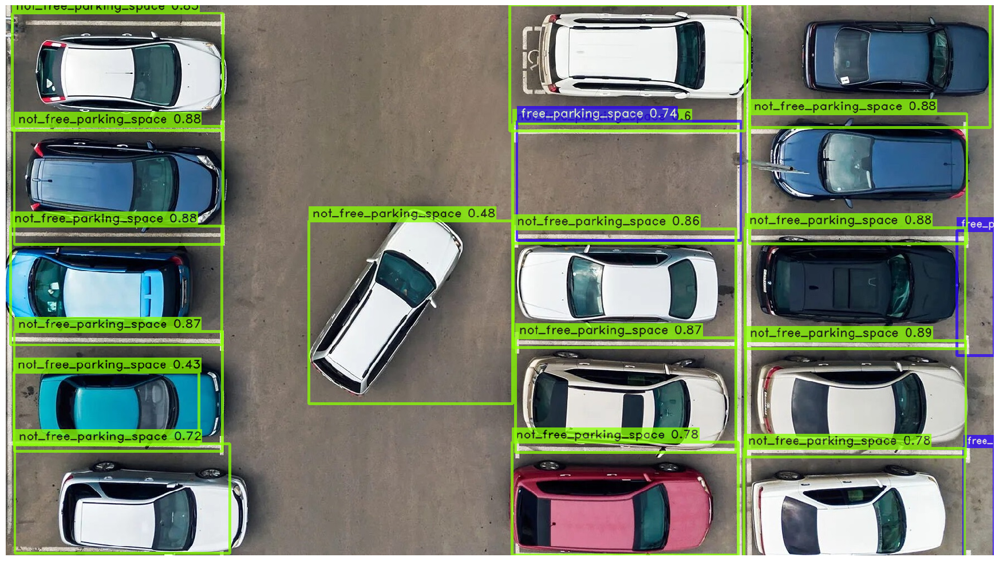

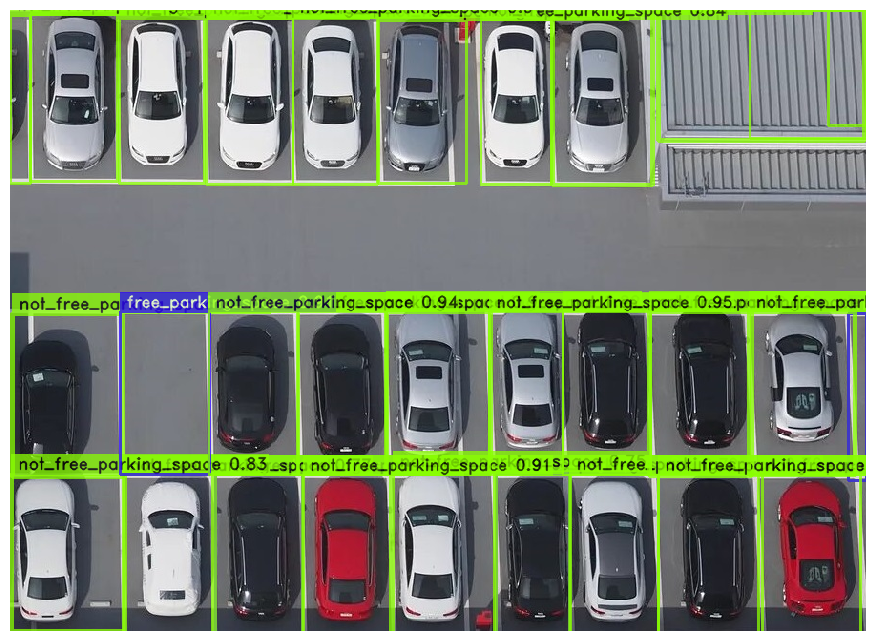

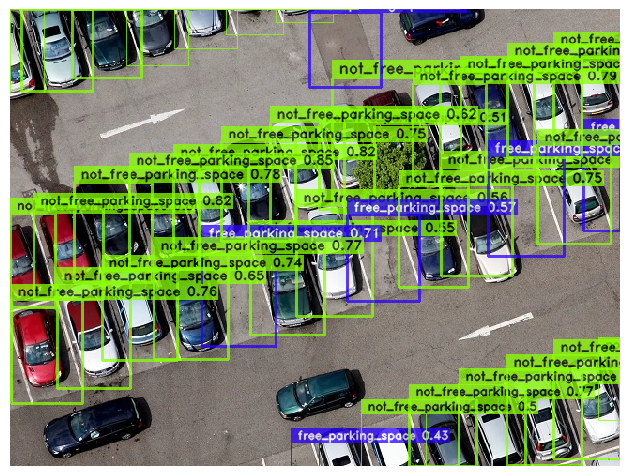

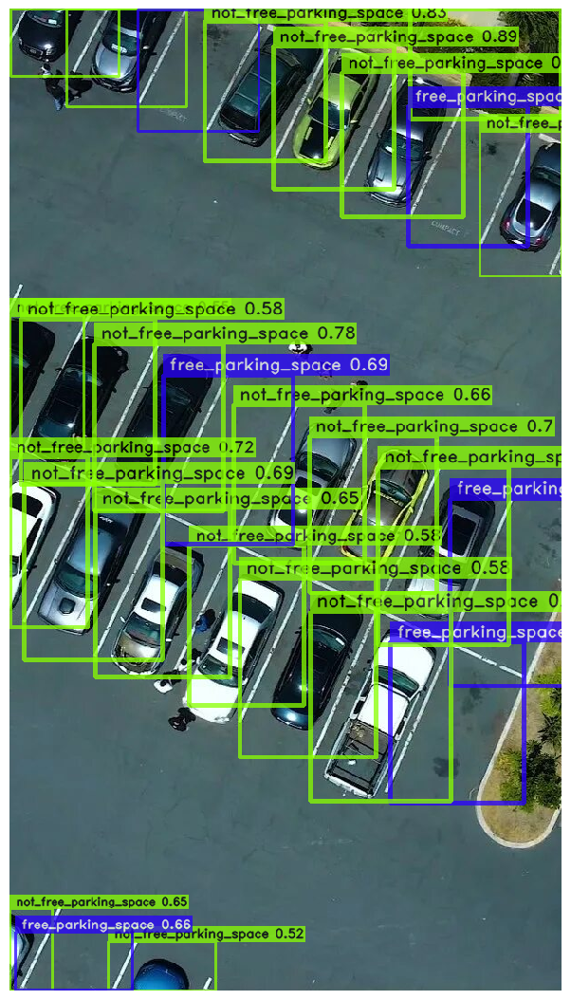

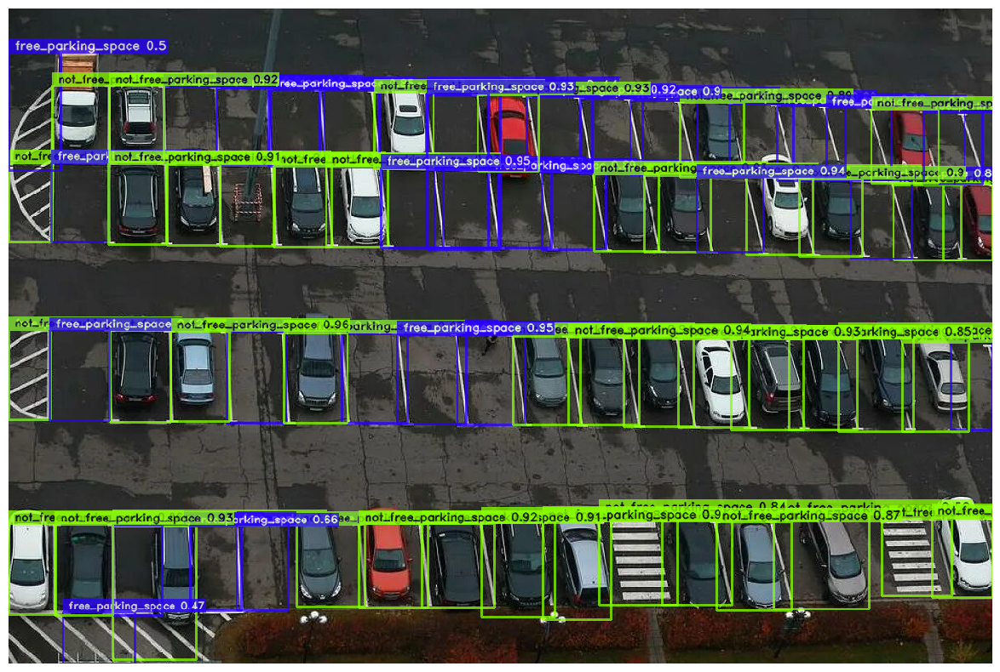

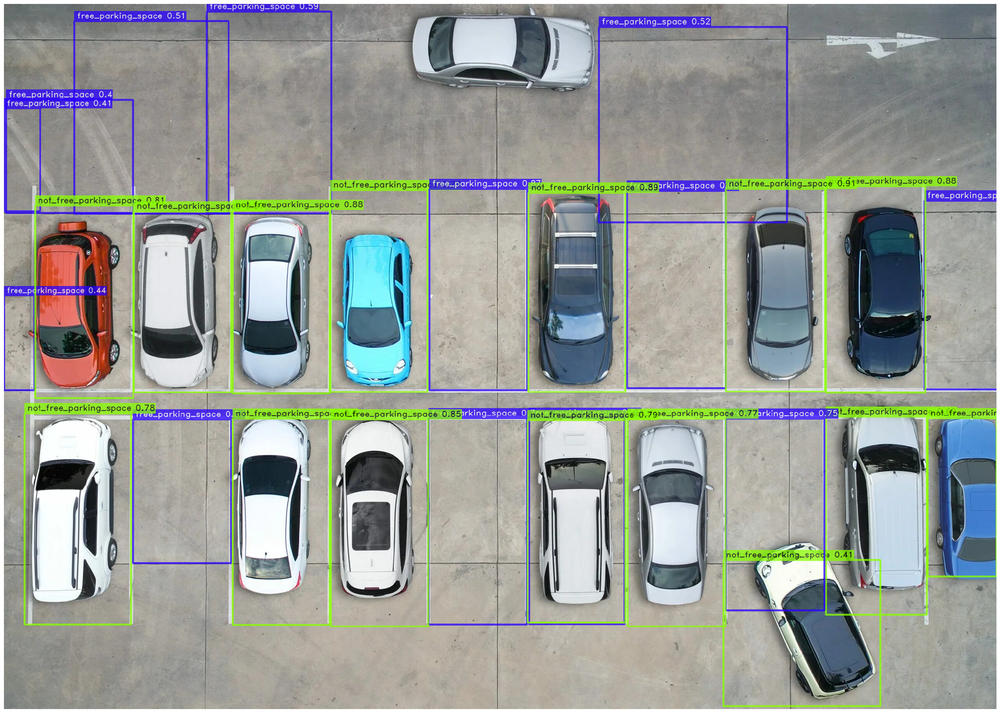

In [22]:
best_model.predict(tpaths, conf=0.4).show()